# **Segmenting and Clustering Airbnb Listings in Lisboa, Portugal**

**Author:** Victor Soeiro Araujo Pereira.

---

## **1. Business Problem**

Airbnb, or Air Bed and Breakfast, is an online platform that connects people who want to rent out their properties with people who are looking for a unique accomodations anywhere in the world. Since 2008, Airbnb has already reached over 100,000 cities, 220 countries and 150 million users (last update 2018). 

The COVID-19 pandemic struck hard the tourism industry. Airbnb, a company that has consolidated its position in the market for the last few years suffered a loss of 85 percent in new bookings. Even though, in 2020 generated $3.4 billion in revenue and launched its IPO the last December. As the pandemic ends, its expected that the tourism industry recover its loss so a notable question to a stakeholder is the best place to invest in properties now. 

Airbnb distributes public data that consist off all properties available in some regions on the platforms. That data doesnt have information from the nearby region, like supermarkets, restaurants, shoppings, etc. I will use the Foursquare API to know the venues in the neighbouhoods. Foursquare is a independent location data platform for understanding how people move through  the real world and its used for many popular services like Uber and Apple Maps. Using the API we can explore an area of 100 meter and limit to 100 venues for each Aibnb listing. 

The main objective of this project is to segment and cluster Airbnb listings in Lisboa, Portugal. To achieve this goal I will use the k-means clustering algorithm. In python programming language, for the geographic visualization, I will use the package Folium to understand the distribution of the clusterings over the 24 freguesias in Lisboa. 

---

## **2. Data**

Based on the Business Problem above I will use the following sources to achive the main objective.

* [**Airbnb Inside**](http://insideairbnb.com/): A website with Airbnb public data. There is data for several regions, including information about the properties, reviews, and a GeoJSON file. We will use three files, the property data, calendar/bookings and the map of the region for geographical visualization of the data. The property data has many columns, but we will select only a few columns of interest to analyze.

* [**Foursquare API**](https://developer.foursquare.com/): Get the most common venues around the Airbnb property given the latitude and longitude.

---

## **3. Setup**

### **3.1. Import Packages**

Import the needed packages to download, analyze and plot data. 

In [1]:
import json
import io
import urllib.request
import requests
import numpy as np
import pandas as pd
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

%matplotlib inline
import matplotlib.pyplot as plt
plt.rcParams['axes.labelsize'] = 16
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12
plt.rcParams["font.family"] = "Open Sans"

import geopandas as gpd
import seaborn as sns
import folium

print('Libraries imported.')

Libraries imported.


### **3.2. Load Airbnb Data**

The method *read_csv* from the Pandas Package allows us to pass an URL as argument do download and read the file. As we can see, the file *listings.csv.gz* is in a zip file format. We can use the argument *compression* to read that file.

In [2]:
airbnb_data_url = 'http://data.insideairbnb.com/portugal/lisbon/lisbon/2021-04-16/data/listings.csv.gz'

df = pd.read_csv(airbnb_data_url, compression='gzip')
df.head(3)

,id,listing_url,scrape_id,last_scraped,name,description,neighborhood_overview,picture_url,host_id,host_url,host_name,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_neighbourhood,host_listings_count,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms,bathrooms_text,bedrooms,beds,amenities,price,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,calendar_updated,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,6499,https://www.airbnb.com/rooms/6499,20210416175606,2021-04-20,Belém 1 Bedroom Historical Apartment,"This apartment is all about Location, next to ...","To get to the city center, tram 15 stops in f...",https://a0.muscache.com/pictures/6422ee92-c84e...,14455,https://www.airbnb.com/users/show/14455,Bruno,2009-04-22,"Brussels, Bruxelles, Belgium","I am Bruno Luis, a Portuguese living in The Ha...",within an hour,100%,100%,f,https://a0.muscache.com/im/users/14455/profile...,https://a0.muscache.com/im/users/14455/profile...,NaN,1.0,1.0,"['email', 'phone', 'reviews', 'jumio', 'offlin...",t,t,"Lisbon, Portugal",Belm,Lisboa,38.69750,-9.19768,Entire apartment,Entire home/apt,3,NaN,1 bath,1.0,1.0,"[""Microwave"", ""Ethernet connection"", ""Extra pi...",$40.00,3,365,3,3,365,365,3.0,365.0,NaN,t,0,0,0,1,2021-04-20,27,1,0,2014-09-02,2021-01-26,91.0,9.0,9.0,10.0,10.0,10.0,9.0,NaN,t,1,1,0,0,0.33
1,25659,https://www.airbnb.com/rooms/25659,20210416175606,2021-04-18,Heart of Alfama - Lisbon Center,*** 100% Covid 19 cleaning protocols <br /><br...,Alfama is the oldest and most picturesque quar...,https://a0.muscache.com/pictures/a4c86b5f-ceaf...,107347,https://www.airbnb.com/users/show/107347,Ellie,2010-04-12,"Lisbon, Lisbon, Portugal",Woman Artist living in Lisbon many years. I li...,within an hour,100%,100%,t,https://a0.muscache.com/im/pictures/user/8568e...,https://a0.muscache.com/im/pictures/user/8568e...,Alfama,1.0,1.0,"['email', 'phone', 'reviews', 'jumio', 'offlin...",t,t,"Lisboa, Portugal",Santa Maria Maior,Lisboa,38.71241,-9.12706,Entire apartment,Entire home/apt,2,NaN,1 bath,1.0,1.0,"[""Fire extinguisher"", ""Washer"", ""Paid parking ...",$30.00,10,90,10,10,1125,1125,10.0,1125.0,NaN,t,0,0,0,170,2021-04-18,114,1,0,2014-04-24,2021-03-01,96.0,10.0,10.0,10.0,10.0,10.0,10.0,56539/AL.,t,1,1,0,0,1.34
2,29248,https://www.airbnb.com/rooms/29248,20210416175606,2021-04-21,Apartamento Alfama com vista para o rio!,<b>The space</b><br />Located in the city cent...,NaN,https://a0.muscache.com/pictures/4212cc65-2046...,125768,https://www.airbnb.com/users/show/125768,Bárbara,2010-05-16,"Vila Nova de Gaia, Porto, Portugal",Hi!\r\n\r\nI'm a marketeer working for a susta...,within an hour,100%,94%,f,https://a0.muscache.com/im/pictures/user/d5c5c...,https://a0.muscache.com/im/pictures/user/d5c5c...,Alfama,3.0,3.0,"['email', 'phone', 'reviews', 'offline_governm...",t,t,NaN,Santa Maria Maior,Lisboa,38.71082,-9.12719,Entire apartment,Entire home/apt,4,NaN,1 bath,1.0,2.0,"[""Kitchen"", ""Host greets you"", ""Wifi"", ""Paid p...",$35.00,3,1125,3,3,1125,1125,3.0,1125.0,NaN,t,12,12,27,302,2021-04-21,326,5,1,2011-01-01,2021-04-09,91.0,10.0,9.0,10.0,10.0,10.0,9.0,23535

Unfortunately, the geoJSON URL can't be passed as argument in the JSON package. We will use the request package with the io package to download the file.

In [3]:
airbnb_geojson_url = 'http://data.insideairbnb.com/portugal/lisbon/lisbon/2021-04-16/visualisations/neighbourhoods.geojson'

geojson_file = io.BytesIO(requests.get(airbnb_geojson_url).content)
geojson = json.load(geojson_file)

geojson['features'][0]['properties']  # Print the first neighborhood.

{'neighbourhood': 'Barcarena', 'neighbourhood_group': 'Oeiras'}

### **3.3. Columns**

In [4]:
df.columns

Index(['id', 'listing_url', 'scrape_id', 'last_scraped', 'name', 'description',
       'neighborhood_overview', 'picture_url', 'host_id', 'host_url',
       'host_name', 'host_since', 'host_location', 'host_about',
       'host_response_time', 'host_response_rate', 'host_acceptance_rate',
       'host_is_superhost', 'host_thumbnail_url', 'host_picture_url',
       'host_neighbourhood', 'host_listings_count',
       'host_total_listings_count', 'host_verifications',
       'host_has_profile_pic', 'host_identity_verified', 'neighbourhood',
       'neighbourhood_cleansed', 'neighbourhood_group_cleansed', 'latitude',
       'longitude', 'property_type', 'room_type', 'accommodates', 'bathrooms',
       'bathrooms_text', 'bedrooms', 'beds', 'amenities', 'price',
       'minimum_nights', 'maximum_nights', 'minimum_minimum_nights',
       'maximum_minimum_nights', 'minimum_maximum_nights',
       'maximum_maximum_nights', 'minimum_nights_avg_ntm',
       'maximum_nights_avg_ntm', 'calendar_upd

### **3.4. Columns Selection**

To explore the data I will select only some columns from the list above.

In [5]:
columns = [
    'id', 
    'host_id', 
    'neighbourhood_group_cleansed', 
    'neighbourhood_cleansed', 
    'latitude', 
    'longitude',
    'room_type', 
    'property_type', 
    'bathrooms_text', 
    'bedrooms', 
    'beds', 
    'accommodates', 
    'price', 
    'minimum_nights', 
    'number_of_reviews', 
    'reviews_per_month', 
    'review_scores_rating', 
    'host_is_superhost'
]

df2 = df[columns].reset_index(drop=True)
df2.head(3)

,id,host_id,neighbourhood_group_cleansed,neighbourhood_cleansed,latitude,longitude,room_type,property_type,bathrooms_text,bedrooms,beds,accommodates,price,minimum_nights,number_of_reviews,reviews_per_month,review_scores_rating,host_is_superhost
0,6499,14455,Lisboa,Belm,38.69750,-9.19768,Entire home/apt,Entire apartment,1 bath,1.0,1.0,3,$40.00,3,27,0.33,91.0,f
1,25659,107347,Lisboa,Santa Maria Maior,38.71241,-9.12706,Entire home/apt,Entire apartment,1 bath,1.0,1.0,2,$30.00,10,114,1.34,96.0,t
2,29248,125768,Lisboa,Santa Maria Maior,38.71082,-9.12719,Entire home/apt,Entire apartment,1 bath,1.0,2.0,4,$35.00,3,326,2.60,91.0,f


To this study I will only explore data from the Freguesia of Lisboa.

In [6]:
df3 = df2[df2.neighbourhood_group_cleansed == 'Lisboa'].reset_index(drop=True)
df3.head(3)

,id,host_id,neighbourhood_group_cleansed,neighbourhood_cleansed,latitude,longitude,room_type,property_type,bathrooms_text,bedrooms,beds,accommodates,price,minimum_nights,number_of_reviews,reviews_per_month,review_scores_rating,host_is_superhost
0,6499,14455,Lisboa,Belm,38.69750,-9.19768,Entire home/apt,Entire apartment,1 bath,1.0,1.0,3,$40.00,3,27,0.33,91.0,f
1,25659,107347,Lisboa,Santa Maria Maior,38.71241,-9.12706,Entire home/apt,Entire apartment,1 bath,1.0,1.0,2,$30.00,10,114,1.34,96.0,t
2,29248,125768,Lisboa,Santa Maria Maior,38.71082,-9.12719,Entire home/apt,Entire apartment,1 bath,1.0,2.0,4,$35.00,3,326,2.60,91.0,f


### **3.5. Fix Freguesias Names**

In [7]:
fix_name_dict = {
    'Belm': 'Belém',
    'Misericrdia': 'Misericórdia',
    'So Vicente': 'São Vicente',
    'Santo Antnio': 'Santo Antônio',
    'Parque das Naes': 'Parque das Nações',
    'Alcntara': 'Alcântara',
    'So Domingos de Benfica': 'São Domingos de Benfica'
}

In [8]:
for v in geojson['features']:
    neighbourhood = v['properties']['neighbourhood']
    if neighbourhood in fix_name_dict.keys():
        v['properties']['neighbourhood'] = fix_name_dict[neighbourhood]

In [9]:
df3.neighbourhood_cleansed = df3.neighbourhood_cleansed.replace(fix_name_dict)

### **3.6. Columns Dtypes**

In [10]:
df3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14039 entries, 0 to 14038
Data columns (total 18 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   id                            14039 non-null  int64  
 1   host_id                       14039 non-null  int64  
 2   neighbourhood_group_cleansed  14039 non-null  object 
 3   neighbourhood_cleansed        14039 non-null  object 
 4   latitude                      14039 non-null  float64
 5   longitude                     14039 non-null  float64
 6   room_type                     14039 non-null  object 
 7   property_type                 14039 non-null  object 
 8   bathrooms_text                14023 non-null  object 
 9   bedrooms                      13271 non-null  float64
 10  beds                          13882 non-null  float64
 11  accommodates                  14039 non-null  int64  
 12  price                         14039 non-null  object 
 13  m

The Dtype of price and bathrooms is not right. We need to fix this.

In [11]:
df3.price = df3.price.str.replace('$', '', regex=False).str.replace(',', '').astype(float)

In [12]:
df3 = df3.rename(columns={'bathrooms_text': 'bathrooms'})
df3.bathrooms = df3.bathrooms.str.split(' ').str[0].apply(lambda x: '0.5' if x in ['Half-bath', 'Shared', 'Private'] else x).astype(float)

### **3.7. Drop Outliers**

Some properties has very high prices. It has so much factors for the price out the curve, but we will drop some of them using the Z-Score.

In [13]:
from scipy import stats

df3 = df3[(np.abs(stats.zscore(df3[['price', 'minimum_nights']])) < 2).all(axis=1)]
df3.head(3)

,id,host_id,neighbourhood_group_cleansed,neighbourhood_cleansed,latitude,longitude,room_type,property_type,bathrooms,bedrooms,beds,accommodates,price,minimum_nights,number_of_reviews,reviews_per_month,review_scores_rating,host_is_superhost
0,6499,14455,Lisboa,Belém,38.69750,-9.19768,Entire home/apt,Entire apartment,1.0,1.0,1.0,3,40.0,3,27,0.33,91.0,f
1,25659,107347,Lisboa,Santa Maria Maior,38.71241,-9.12706,Entire home/apt,Entire apartment,1.0,1.0,1.0,2,30.0,10,114,1.34,96.0,t
2,29248,125768,Lisboa,Santa Maria Maior,38.71082,-9.12719,Entire home/apt,Entire apartment,1.0,1.0,2.0,4,35.0,3,326,2.60,91.0,f


### **3.8. Null Values**

In [14]:
df3 = df3.dropna().reset_index(drop=True)
df3.head(3)

,id,host_id,neighbourhood_group_cleansed,neighbourhood_cleansed,latitude,longitude,room_type,property_type,bathrooms,bedrooms,beds,accommodates,price,minimum_nights,number_of_reviews,reviews_per_month,review_scores_rating,host_is_superhost
0,6499,14455,Lisboa,Belém,38.69750,-9.19768,Entire home/apt,Entire apartment,1.0,1.0,1.0,3,40.0,3,27,0.33,91.0,f
1,25659,107347,Lisboa,Santa Maria Maior,38.71241,-9.12706,Entire home/apt,Entire apartment,1.0,1.0,1.0,2,30.0,10,114,1.34,96.0,t
2,29248,125768,Lisboa,Santa Maria Maior,38.71082,-9.12719,Entire home/apt,Entire apartment,1.0,1.0,2.0,4,35.0,3,326,2.60,91.0,f


### **3.9. Shape**

In [15]:
df3.shape

(10500, 18)

We have a total of 10500 rows to analyze, segment and cluster in Lisboa.

---

## **Exploratory Data Analysis**

### **Neighbourhood Count**

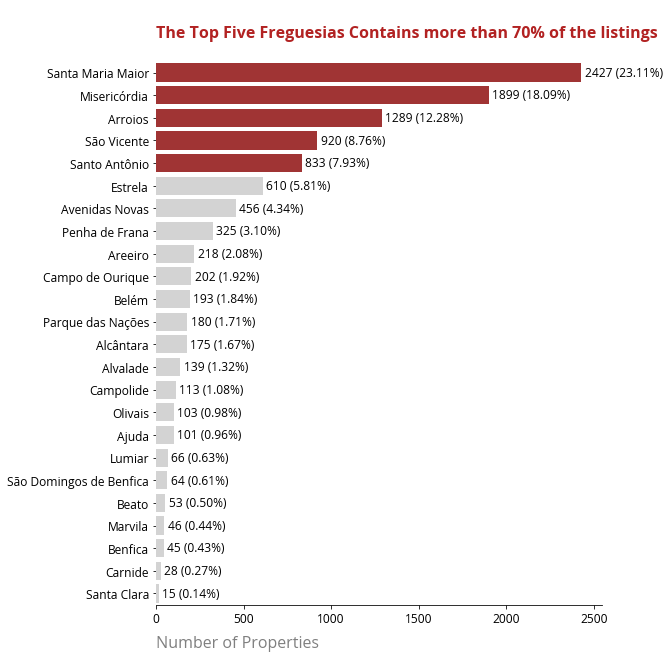

In [16]:
fig, ax = plt.subplots(figsize=(8,10))

order = df3['neighbourhood_cleansed'].value_counts().index
custom_palette = ['firebrick' if i < 5 else 'lightgray' for i in range(df3.neighbourhood_cleansed.nunique())]

sns.countplot(
    y='neighbourhood_cleansed',   
    data=df3,         
    orient = 'h',            
    palette=custom_palette,       
    order=order, 
    ax=ax
)

perc = df3.neighbourhood_cleansed.value_counts() / df3.shape[0] * 100

for idx, p in enumerate(ax.patches):
    ax.annotate('{} ({:.2f}%)'.format(df3.neighbourhood_cleansed.value_counts()[idx], perc[idx]),
                (df3.neighbourhood_cleansed.value_counts()[idx] +20, p.get_y() + p.get_height() / 2),
                fontsize=12, ha='left', va='center')

ax.set_axisbelow(True)
ax.tick_params(axis='both', labelsize=12)
ax.spines['left'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

plt.ylabel('')
plt.xlabel(
    'Number of Properties',
    rotation=0,
    position=(.5, .5),
    fontsize=16,
    color='gray',
    labelpad=10,
    loc='left'
)

plt.title(
    '\nThe Top Five Freguesias Contains more than 70% of the listings\n',
    loc='left',
    fontsize=16,
    fontweight='bold',
    color='firebrick'
)

plt.show()

### **Room Type Count**

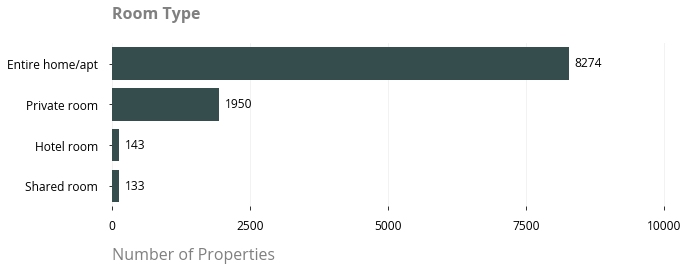

In [17]:
fig, ax = plt.subplots(figsize=(10,3))

sns.countplot(
    y='room_type', 
    data=df3, 
    color='#315151', 
    orient='h',     
    order=df3['room_type'].value_counts().index, 
    ax=ax
)

for idx, p in enumerate(ax.patches):
    ax.annotate(
        '{}'.format(df3.room_type.value_counts()[idx]),
        (df3.room_type.value_counts()[idx] + 100, p.get_y() + p.get_height() / 2),   
        fontsize=12, 
        va='center'
    )

ax.xaxis.grid(True, alpha=0.2)
ax.set_axisbelow(True)
ax.spines['left'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.tick_params(axis='both', labelsize=12, pad=10)

plt.xticks(np.arange(0, 12500, 2500))
plt.xlim(0, 10100)

plt.ylabel('')

plt.xlabel(
    'Number of Properties',
    rotation=0,
    fontsize=16,
    color='gray',
    labelpad=15,
    loc='left'
)

plt.title(
    'Room Type\n',
    loc='left',
    fontsize=16,
    fontweight='bold',
    color='gray'
)

plt.show()

### **Price**

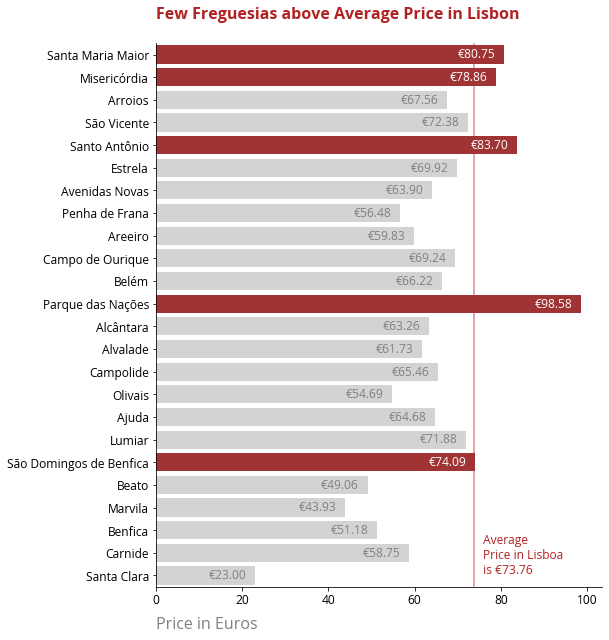

In [18]:
fig, ax = plt.subplots(figsize=(8,10))

price_avg = df3.price.mean()
custom_palette = (df3.groupby('neighbourhood_cleansed').price.mean() < price_avg).replace({True: 'lightgray', False: 'firebrick'}).to_dict()

sns.barplot(
    x='price', 
    y='neighbourhood_cleansed', 
    data=df3, 
    orient='h', 
    palette=custom_palette, 
    order=order, 
    ax=ax, 
    errcolor='dimgray',
    zorder=2,
    ci=None,
)

means = df3.groupby('neighbourhood_cleansed').price.mean()[order]

for idx, p in enumerate(ax.patches):
    ax.annotate(
        '€{:.2f}'.format(means[idx]),
        (means[idx] - 2, p.get_y() + p.get_height() / 2), 
        fontsize=12, 
        color='white' if means[idx] > price_avg else 'gray', 
        ha='right', 
        va='center', 
        zorder=3
    )

ax.set_axisbelow(True)
ax.tick_params(axis='both', labelsize=12)
sns.despine()

plt.axvline(x=price_avg, color='firebrick', alpha=.5, zorder=1)

ax.text(
    price_avg + 2, 
    ax.patches[-1].get_y() + 0.3, 
    f'Average\nPrice in Lisboa\nis €{price_avg:.2f}', 
    ha='left',
    fontsize=12,
    color='firebrick'
)

plt.ylabel('')

plt.xlabel(
    'Price in Euros',
    rotation=0,
    position=(.5, .5),
    fontsize=16,
    color='gray',
    labelpad=10,
    loc='left'
)

plt.title(
    'Few Freguesias above Average Price in Lisbon\n',
    loc='left',
    fontsize=16,
    fontweight='bold',
    color='firebrick'
)

plt.show()

### **Geographic Visualization**

To visualize our listings in the map of Lisboa I will use the Folium package and the Mapbox tiles. But first I will find the latitude and longitude of Lisboa, Portugal using the geopy package.

In [19]:
from geopy.geocoders import Nominatim

address = 'Lisboa, Portugal'

geolocator = Nominatim(user_agent="zh_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
lisboa_loc = [latitude, longitude]

print('The geograpical coordinates of Lisbon are {}, {}.'.format(latitude, longitude))

The geograpical coordinates of Lisbon are 38.7077507, -9.1365919.


In [20]:
mapbox_token = 'pk.eyJ1IjoidmljdG9yc29laXJvIiwiYSI6ImNrcGh1NWg1MzBpMTEzMWxhNWttb3hmM3cifQ.OxvE5OlE4DW_z8eiZ3vXLA'

In [21]:
lisboa_geo = geojson.copy()
lisboa_geo['features'] = [v for v in geojson['features'] if v['properties']['neighbourhood_group'] == 'Lisboa']

m = folium.Map(
    location=lisboa_loc,  
    tiles='https://api.mapbox.com/styles/v1/mapbox/light-v10/tiles/{z}/{x}/{y}?access_token=' + mapbox_token, 
    attr='Mapbox',
    zoom_start=12
)

style_function = lambda x: {'fillColor': 'skyblue', 'fillOpacity': 0.4, 'color': 'dimgray', 'opacity': 0.5, 'weight': .5}

folium.GeoJson(lisboa_geo, name='geojson', tooltip=folium.GeoJsonTooltip(fields=['neighbourhood'], labels=False), style_function=style_function).add_to(m)

for idx, row in df3.iterrows():
    label = '{},\n{},\nSatisfaction: {}'.format(row['neighbourhood_cleansed'], row['room_type'], row['review_scores_rating'])
    label = folium.Popup(label, parse_html=True)
    
    folium.CircleMarker(
        [row['latitude'], row['longitude']],
        radius=.1,
        popup=label,
        color='darkslategray',
        fill=True,
        fill_color='red',
        fill_opacity=0.2,
        parse_html=False
    ).add_to(m)

m

---

## **Analyze Airbnb Listing**

### **Segmenting**

Due the lack of data on the others neighbourhoods, we will segment and cluster only the top five freguesias

In [22]:
top_five = df3.neighbourhood_cleansed.value_counts().head().index
top_five_mask = df3.neighbourhood_cleansed.isin(top_five)

df4 = df3[top_five_mask]
df4.head(3)

,id,host_id,neighbourhood_group_cleansed,neighbourhood_cleansed,latitude,longitude,room_type,property_type,bathrooms,bedrooms,beds,accommodates,price,minimum_nights,number_of_reviews,reviews_per_month,review_scores_rating,host_is_superhost
1,25659,107347,Lisboa,Santa Maria Maior,38.71241,-9.12706,Entire home/apt,Entire apartment,1.0,1.0,1.0,2,30.0,10,114,1.34,96.0,t
2,29248,125768,Lisboa,Santa Maria Maior,38.71082,-9.12719,Entire home/apt,Entire apartment,1.0,1.0,2.0,4,35.0,3,326,2.60,91.0,f
3,29396,126415,Lisboa,Santa Maria Maior,38.71156,-9.12987,Entire home/apt,Entire apartment,1.0,1.0,1.0,4,37.0,2,267,2.46,96.0,t


### **Foursquare API**

To use the Foursquare API is needed a account to get the client ID e client Secret.

In [23]:
CLIENT_ID = 'DEGWP3RJZZW1CHYEVO1ER14TPTJCR3OGU4ACM4ZYHRGZXTPX'
CLIENT_SECRET = '2FWP3KJB323S5TWWRMJDU0YYMTOMFPBNQHXTHFQVD12LMJHS'
VERSION = '20190605'

In [24]:
def get_venues(listing, radius=500, limit=100):
    url = 'https://api.foursquare.com/v2/venues/explore?client_id={}&client_secret={}&ll={},{}&v={}&radius={}&limit={}'.format(
        CLIENT_ID, CLIENT_SECRET, listing['latitude'], listing['longitude'], VERSION, radius, limit)
    
    r = requests.get(url).json()
    
    try:
        return [(
            listing['id'],
            v['venue']['name'],
            v['venue']['location']['lat'],
            v['venue']['location']['lng'],
            v['venue']['categories'][0]['name']
            ) for v in r['response']['groups'][0]['items']
        ]

    except:
        return []

In [25]:
venues_df = pd.read_csv('backup_venues.csv')

#venues = []
#for idx, listing in df4.iterrows():
#    venues.extend(get_venues(listing))

We have all the venues from all airbnb listings, let's transform it a Pandas DataFrame, and save for backup.

In [26]:
columns = [
    'id',
    'venue_name',
    'venue_latitude',
    'venue_longitude',
    'venue_category'
]

#venues_df = pd.DataFrame(venues, columns=columns)
#venues_df.to_csv('backup_venues.csv', index=False)
venues_df.head(3)

,id,venue_name,venue_latitude,venue_longitude,venue_category
0,25209609,A Padaria Portuguesa,38.731295,-9.136410,Bakery
1,25209609,Vila Garden Guest House,38.730409,-9.134692,Hotel
2,25209609,Delícia de Arroios,38.730620,-9.136180,Portuguese Restaurant


Shape of our venues dataframe.

In [27]:
venues_df.shape

(159491, 5)

Unique categories of our venues.

In [28]:
venues_df.venue_category.unique()

array(['Bakery', 'Hotel', 'Portuguese Restaurant', 'Chinese Restaurant',
       'Gym', 'Café', 'Coffee Shop', 'Beach', 'Brewery', 'Supermarket',
       'Asian Restaurant', 'Hostel', 'Pastry Shop', 'Seafood Restaurant',
       'Pizza Place', 'Breakfast Spot', 'Rock Climbing Spot', 'Theater',
       'Vegetarian / Vegan Restaurant', 'Street Art', 'Scenic Lookout',
       'Arts & Crafts Store', 'Bistro', 'Food & Drink Shop', 'Plaza',
       'Wine Bar', 'Bar', 'Mediterranean Restaurant',
       'Comfort Food Restaurant', 'Other Nightlife', 'Creperie',
       'BBQ Joint', 'Gastropub', 'Garden', 'Beer Bar', 'Food Stand',
       'Indian Restaurant', 'Sushi Restaurant', 'History Museum',
       'Cocktail Bar', 'Brazilian Restaurant', 'Restaurant', 'Roof Deck',
       'Cheese Shop', 'Market', 'Tapas Restaurant', 'Ice Cream Shop',
       'Museum', 'Pub', 'Road', 'Movie Theater', 'Russian Restaurant',
       'Pool Hall', 'Record Shop', 'Modern European Restaurant',
       'Clothing Store', 'Access

And the number of unique categories.

In [29]:
venues_df.venue_category.nunique()

191

### **Onehot Encoding**

In [30]:
venues_onehot = pd.get_dummies(venues_df[['venue_category']], prefix="", prefix_sep="")
venues_onehot['id'] = venues_df['id']
venues_onehot = venues_onehot[['id'] + [col for col in venues_onehot.columns if col != 'id']]
venues_onehot.head(3)

,id,Accessories Store,African Restaurant,American Restaurant,Amphitheater,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Australian Restaurant,BBQ Joint,Bagel Shop,Bakery,Bar,Beach,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Bike Rental / Bike Share,Bistro,Boarding House,Boat or Ferry,Bookstore,Boutique,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Buffet,Burger Joint,Café,Cajun / Creole Restaurant,Candy Store,Capitol Building,Casino,Castle,Cheese Shop,Chinese Restaurant,Chocolate Shop,Church,Clothing Store,Cocktail Bar,Coffee Shop,College Academic Building,Comfort Food Restaurant,Concert Hall,Convenience Store,Creperie,Cultural Center,Cupcake Shop,Dance Studio,Deli / Bodega,Dessert Shop,Dim Sum Restaurant,Diner,Dive Bar,Doner Restaurant,Electronics Store,Empanada Restaurant,Escape Room,Event Space,Falafel Restaurant,Farmers Market,Fast Food Restaurant,Fish & Chips Shop,Fish Market,Flea Market,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,French Restaurant,Fried Chicken Joint,Fruit & Vegetable Store,Furniture / Home Store,Garden,Gastropub,Gay Bar,General Entertainment,Gift Shop,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Harbor / Marina,Himalayan Restaurant,Historic Site,History Museum,Hostel,Hot Dog Joint,Hotel,Hotel Bar,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Israeli Restaurant,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Laundromat,Lebanese Restaurant,Lounge,Market,Massage Studio,Mediterranean Restaurant,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Mobile Phone Shop,Modern European Restaurant,Motel,Movie Theater,Moving Target,Museum,Music Venue,Nightclub,Noodle House,Opera House,Organic Grocery,Other Nightlife,Park,Pastry Shop,Pedestrian Plaza,Performing Arts Venue,Persian Restaurant,Peruvian Restaurant,Pharmacy,Pier,Pizza Place,Plaza,Poke Place,Pool,Pool Hall,Portuguese Restaurant,Pub,Public Bathroom,Ramen Restaurant,Record Shop,Rental Car Location,Resort,Restaurant,Road,Rock Climbing Spot,Rock Club,Roof Deck,Russian Restaurant,Salad Place,Salon / Barbershop,Sandwich Place,Sausage Shop,Scenic Lookout,Science Museum,Seafood Restaurant,Shopping Mall,Snack Place,Soccer Stadium,South American Restaurant,South Indian Restaurant,Souvenir Shop,Spa,Spanish Restaurant,Speakeasy,Sports Bar,Steakhouse,Street Art,Supermarket,Sushi Restaurant,Swiss Restaurant,Tapas Restaurant,Tea Room,Thai Restaurant,Theater,Tibetan Restaurant,Tourist Information Center,Train Station,Tram Station,Vegetarian / Vegan Restaurant,Vietnamese Restaurant,Waterfront,Wine Bar,Wine Shop,Wings Joint,Women's Store,Yoga Studio
0,25209609,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,25209609,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,25209609,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [31]:
venues_groups = venues_onehot.groupby(['id']).mean().reset_index()
venues_groups.head(3)

,id,Accessories Store,African Restaurant,American Restaurant,Amphitheater,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Australian Restaurant,BBQ Joint,Bagel Shop,Bakery,Bar,Beach,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Bike Rental / Bike Share,Bistro,Boarding House,Boat or Ferry,Bookstore,Boutique,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Buffet,Burger Joint,Café,Cajun / Creole Restaurant,Candy Store,Capitol Building,Casino,Castle,Cheese Shop,Chinese Restaurant,Chocolate Shop,Church,Clothing Store,Cocktail Bar,Coffee Shop,College Academic Building,Comfort Food Restaurant,Concert Hall,Convenience Store,Creperie,Cultural Center,Cupcake Shop,Dance Studio,Deli / Bodega,Dessert Shop,Dim Sum Restaurant,Diner,Dive Bar,Doner Restaurant,Electronics Store,Empanada Restaurant,Escape Room,Event Space,Falafel Restaurant,Farmers Market,Fast Food Restaurant,Fish & Chips Shop,Fish Market,Flea Market,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,French Restaurant,Fried Chicken Joint,Fruit & Vegetable Store,Furniture / Home Store,Garden,Gastropub,Gay Bar,General Entertainment,Gift Shop,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Harbor / Marina,Himalayan Restaurant,Historic Site,History Museum,Hostel,Hot Dog Joint,Hotel,Hotel Bar,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Israeli Restaurant,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Laundromat,Lebanese Restaurant,Lounge,Market,Massage Studio,Mediterranean Restaurant,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Mobile Phone Shop,Modern European Restaurant,Motel,Movie Theater,Moving Target,Museum,Music Venue,Nightclub,Noodle House,Opera House,Organic Grocery,Other Nightlife,Park,Pastry Shop,Pedestrian Plaza,Performing Arts Venue,Persian Restaurant,Peruvian Restaurant,Pharmacy,Pier,Pizza Place,Plaza,Poke Place,Pool,Pool Hall,Portuguese Restaurant,Pub,Public Bathroom,Ramen Restaurant,Record Shop,Rental Car Location,Resort,Restaurant,Road,Rock Climbing Spot,Rock Club,Roof Deck,Russian Restaurant,Salad Place,Salon / Barbershop,Sandwich Place,Sausage Shop,Scenic Lookout,Science Museum,Seafood Restaurant,Shopping Mall,Snack Place,Soccer Stadium,South American Restaurant,South Indian Restaurant,Souvenir Shop,Spa,Spanish Restaurant,Speakeasy,Sports Bar,Steakhouse,Street Art,Supermarket,Sushi Restaurant,Swiss Restaurant,Tapas Restaurant,Tea Room,Thai Restaurant,Theater,Tibetan Restaurant,Tourist Information Center,Train Station,Tram Station,Vegetarian / Vegan Restaurant,Vietnamese Restaurant,Waterfront,Wine Bar,Wine Shop,Wings Joint,Women's Store,Yoga Studio
0,25659,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.027027,0.0,0.0,0.0,0.0,0.0,0.027027,0.081081,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.054054,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.027027,0.0,0.027027,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.027027,0.0,0.027027,0.0,0.027027,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.027027,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.027027,0.027027,0.0,0.0,0.0,0.0,0.0,0.0,0.027027,0.0,0.0,0.0,0.0,0.0,0.000000,0.027027,0.000000,0.0,0.0,0.0,0.378378,0.000000,0.0,0.0,0.0,0.0,0.0,0.027027,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.027027,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.027027,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.081081,0.0,0.0,0.0,0.0
1,29248,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.083333,0.083333,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.041667,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0000

### **Most Frequent Venues per Listing**

Now, let's use the matrix above to get the most frequency venues for each listing using a simple function.

In [32]:
def get_most_venues_frequency(row, top=10):
    return row.iloc[1:].sort_values(ascending=False).index.values[:top]

In [33]:
n_values = 10

columns = ['id']
for i in np.arange(n_values):
    columns.append(f'top_{i+1}')

id_top = pd.DataFrame(columns=columns)
id_top['id'] = venues_groups['id']

for idx, row in venues_groups.iterrows():
    id_top.iloc[idx, 1:] = get_most_venues_frequency(row, top=n_values)
    
id_top.head(3)

,id,top_1,top_2,top_3,top_4,top_5,top_6,top_7,top_8,top_9,top_10
0,25659,Portuguese Restaurant,Bar,Wine Bar,Café,Hotel,Restaurant,Comfort Food Restaurant,Pizza Place,Coffee Shop,Scenic Lookout
1,29248,Portuguese Restaurant,Bar,Bakery,Wine Bar,Museum,Café,Pastry Shop,Scenic Lookout,Tapas Restaurant,Mediterranean Restaurant
2,29396,Portuguese Restaurant,Hotel,Bakery,Plaza,Tapas Restaurant,Hostel,Mediterranean Restaurant,Museum,Pub,Scenic Lookout


### **Most Frequent Venues per Neighbourhood**

Doing the same thing to get the most frequency venues for each neighbourhood.

In [34]:
venues_neighbourhood = df4[['id', 'neighbourhood_cleansed']].merge(venues_groups, on='id').drop('id', axis=1)
venues_neighbourhood = venues_neighbourhood.groupby('neighbourhood_cleansed').mean().reset_index()
venues_neighbourhood.head()

,neighbourhood_cleansed,Accessories Store,African Restaurant,American Restaurant,Amphitheater,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Australian Restaurant,BBQ Joint,Bagel Shop,Bakery,Bar,Beach,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Bike Rental / Bike Share,Bistro,Boarding House,Boat or Ferry,Bookstore,Boutique,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Buffet,Burger Joint,Café,Cajun / Creole Restaurant,Candy Store,Capitol Building,Casino,Castle,Cheese Shop,Chinese Restaurant,Chocolate Shop,Church,Clothing Store,Cocktail Bar,Coffee Shop,College Academic Building,Comfort Food Restaurant,Concert Hall,Convenience Store,Creperie,Cultural Center,Cupcake Shop,Dance Studio,Deli / Bodega,Dessert Shop,Dim Sum Restaurant,Diner,Dive Bar,Doner Restaurant,Electronics Store,Empanada Restaurant,Escape Room,Event Space,Falafel Restaurant,Farmers Market,Fast Food Restaurant,Fish & Chips Shop,Fish Market,Flea Market,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,French Restaurant,Fried Chicken Joint,Fruit & Vegetable Store,Furniture / Home Store,Garden,Gastropub,Gay Bar,General Entertainment,Gift Shop,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Harbor / Marina,Himalayan Restaurant,Historic Site,History Museum,Hostel,Hot Dog Joint,Hotel,Hotel Bar,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Israeli Restaurant,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Laundromat,Lebanese Restaurant,Lounge,Market,Massage Studio,Mediterranean Restaurant,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Mobile Phone Shop,Modern European Restaurant,Motel,Movie Theater,Moving Target,Museum,Music Venue,Nightclub,Noodle House,Opera House,Organic Grocery,Other Nightlife,Park,Pastry Shop,Pedestrian Plaza,Performing Arts Venue,Persian Restaurant,Peruvian Restaurant,Pharmacy,Pier,Pizza Place,Plaza,Poke Place,Pool,Pool Hall,Portuguese Restaurant,Pub,Public Bathroom,Ramen Restaurant,Record Shop,Rental Car Location,Resort,Restaurant,Road,Rock Climbing Spot,Rock Club,Roof Deck,Russian Restaurant,Salad Place,Salon / Barbershop,Sandwich Place,Sausage Shop,Scenic Lookout,Science Museum,Seafood Restaurant,Shopping Mall,Snack Place,Soccer Stadium,South American Restaurant,South Indian Restaurant,Souvenir Shop,Spa,Spanish Restaurant,Speakeasy,Sports Bar,Steakhouse,Street Art,Supermarket,Sushi Restaurant,Swiss Restaurant,Tapas Restaurant,Tea Room,Thai Restaurant,Theater,Tibetan Restaurant,Tourist Information Center,Train Station,Tram Station,Vegetarian / Vegan Restaurant,Vietnamese Restaurant,Waterfront,Wine Bar,Wine Shop,Wings Joint,Women's Store,Yoga Studio
0,Arroios,0.000000,0.000000,0.002019,0.000000,0.000000,0.002086,0.000000,0.005506,0.012002,0.000000,0.000000,0.016856,0.00131,0.024611,0.011002,0.005578,0.000668,0.003065,0.000000,0.000000,0.000000,0.011916,0.000000,0.000000,0.000867,0.000000,0.017093,0.010922,0.010254,0.000000,0.000000,0.018195,0.095694,0.000000,0.000000,0.000000,0.000152,0.00000,0.000778,0.016659,0.000000,0.000000,0.000545,0.008005,0.016477,0.004238,0.000000,0.006427,0.00261,0.000000,0.00411,0.000000,0.000000,0.002353,0.000040,0.001304,0.000000,0.005246,0.000158,0.008646,0.000000,0.000000,0.000000,0.000000,0.002604,0.000179,0.000000,0.000000,0.000000,0.000000,0.000066,0.000000,0.002873,0.000000,0.000000,0.000000,0.006303,0.000000,0.007653,0.005714,0.000000,0.003439,0.000592,0.000025,0.004207,0.011580,0.006637,0.008224,0.000000,0.000000,0.002646,0.000000,0.000000,0.030479,0.0000,0.106970,0.001251,0.004315,0.051786,0.000580,0.000000,0.008286,0.001955,0.000000,0.000000,0.000000,0.002961,0.000000,0.000792,0.001313,0.000000,0.005775,0.000000,0.000000,0.007999,0.000000,0.000596,0.008163,0.000522,0.000000,0.000000,0.004581,0.000000,0.00035,0.000000,0.008174,0.000000,0.009991,0.006585,0.000000,0.000000,0.000000,0.000000,0.004813,0.000000,0.010196,0.034564,0.000000,0.000222,0.000000,0.128552,0.0015

In [35]:
n_values = 10

columns = ['neighbourhood']
for i in np.arange(n_values):
    columns.append(f'top_{i+1}')

neighbourhood_top = pd.DataFrame(columns=columns)
neighbourhood_top['neighbourhood'] = venues_neighbourhood['neighbourhood_cleansed']

for idx, row in venues_neighbourhood.iterrows():
    neighbourhood_top.iloc[idx, 1:] = get_most_venues_frequency(row, top=n_values)

neighbourhood_top.head()

,neighbourhood,top_1,top_2,top_3,top_4,top_5,top_6,top_7,top_8,top_9,top_10
0,Arroios,Portuguese Restaurant,Hotel,Café,Indian Restaurant,Restaurant,Plaza,Hostel,Seafood Restaurant,Bakery,Supermarket
1,Misericórdia,Portuguese Restaurant,Bar,Café,Restaurant,Breakfast Spot,Wine Bar,Hostel,Coffee Shop,Bed & Breakfast,Tapas Restaurant
2,Santa Maria Maior,Portuguese Restaurant,Hotel,Plaza,Bar,Café,Hostel,Wine Bar,Scenic Lookout,Ice Cream Shop,Restaurant
3,Santo Antônio,Portuguese Restaurant,Hotel,Café,Restaurant,Breakfast Spot,Science Museum,Hostel,Mediterranean Restaurant,Pizza Place,Coffee Shop
4,São Vicente,Portuguese Restaurant,Café,Bakery,Mediterranean Restaurant,Scenic Lookout,Wine Bar,Breakfast Spot,Bar,Indian Restaurant,Hotel


In [36]:
neighbourhood_top_perc = neighbourhood_top.copy()

for idx, row in neighbourhood_top.iterrows():
    neighbourhood_top_perc.iloc[idx, 1:] = venues_neighbourhood.loc[idx, neighbourhood_top.iloc[idx, 1:]] * 100

neighbourhood_top_perc.head()

,neighbourhood,top_1,top_2,top_3,top_4,top_5,top_6,top_7,top_8,top_9,top_10
0,Arroios,12.855196,10.696979,9.569383,5.178633,4.520802,3.456419,3.047872,2.95726,2.461097,1.970535
1,Misericórdia,12.925443,8.200574,4.956864,4.003875,3.764167,3.702168,3.363861,3.240441,2.630898,2.066641
2,Santa Maria Maior,18.938699,6.949397,5.3949,5.050407,5.013695,4.428871,4.017008,2.827224,2.680295,2.133831
3,Santo Antônio,13.56394,12.13322,6.395878,3.963054,3.376587,2.372827,2.325945,2.2111,1.714809,1.699166
4,São Vicente,18.008199,10.547709,8.441978,3.296397,3.274908,2.894288,2.776708,2.533252,2.484676,2.350789


### **Exploring**

In [38]:
restaurants_cats = [cat for cat in venues_df.venue_category.unique() if 'Restaurant' in cat]
print('There is a total of', len(restaurants_cats), 'types of restaurant.')
venues_neighbourhood[restaurants_cats].T.sum()

There is a total of 43 types of restaurant.


0    0.359476
1    0.334982
2    0.339553
3    0.399145
4    0.336764
dtype: float64

In [39]:
museums_cats = [cat for cat in venues_df.venue_category.unique() if 'Museum' in cat]
print('There is a total of', len(museums_cats), 'types of museum.')
venues_neighbourhood[museums_cats].T.sum()

There is a total of 4 types of museum.


0    0.000000
1    0.002093
2    0.022784
3    0.025886
4    0.011400
dtype: float64

## Machine Learning Model

In [40]:
features = ['id', 'price', 'review_scores_rating', 'host_is_superhost']

venues_model = df4[features]
#venues_model = df4[features].merge(venues_groups, on='id')
#venues_model.room_type = venues_model.room_type.astype('category').cat.codes
venues_model['host_is_superhost'] = venues_model.host_is_superhost.astype('category').cat.codes
venues_model.head(3)

<ipython-input-40-cdc75a0dc73b>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  venues_model['host_is_superhost'] = venues_model.host_is_superhost.astype('category').cat.codes


,id,price,review_scores_rating,host_is_superhost
1,25659,30.0,96.0,1
2,29248,35.0,91.0,0
3,29396,37.0,96.0,1


### Data Scaling

In [41]:
from sklearn.preprocessing import StandardScaler

X = venues_model.drop(['id'], axis=1).values
cluster_scaler = StandardScaler().fit_transform(X)
cluster_scaler

array([[-0.78290135,  0.40861571,  1.36553899],
       [-0.70004727, -0.23529749, -0.73231157],
       [-0.66690563,  0.40861571,  1.36553899],
       ...,
       [-1.06460522,  0.92374626, -0.73231157],
       [-1.06460522,  0.92374626, -0.73231157],
       [-0.60062237,  0.92374626, -0.73231157]])

### Cluster

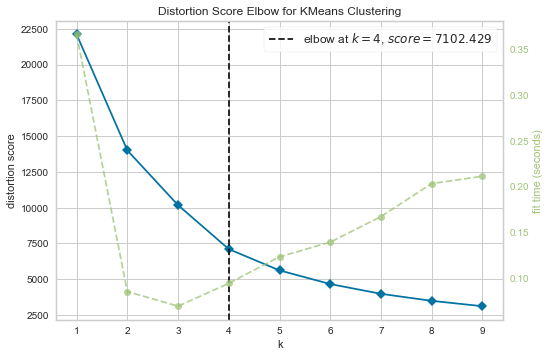

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [42]:
#!pip install yellowbrick --user
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer

model = KMeans()

visualizer = KElbowVisualizer(model, k=(1,10))
visualizer.fit(cluster_scaler)        
visualizer.show() 

#inertias = []
#for i in np.arange(n_max):
#    kmeans_n = [KMeans(n_clusters=n).fit(cluster_scaler) for n in np.arange(1, n_max)]
#    inertias.append([kmeans.inertia_ for kmeans in kmeans_n])

#inertias_df = pd.DataFrame(inertias)
#inertias_df

In [43]:
k = 5
kmeans = KMeans(n_clusters=k, random_state=0).fit(cluster_scaler)
kmeans.labels_

array([3, 1, 3, ..., 0, 0, 0])

### Results

In [44]:
#df5 = id_top.merge(df4[features + ['latitude', 'longitude']], on='id')
df5 = df4[features + ['latitude', 'longitude']]

df5['cluster_group'] = kmeans.labels_
df5.head(3)

<ipython-input-44-5b6043b3ca39>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df5['cluster_group'] = kmeans.labels_


,id,price,review_scores_rating,host_is_superhost,latitude,longitude,cluster_group
1,25659,30.0,96.0,t,38.71241,-9.12706,3
2,29248,35.0,91.0,f,38.71082,-9.12719,1
3,29396,37.0,96.0,t,38.71156,-9.12987,3


In [45]:
num_top_venues = 5

for cluster in df5.cluster_group.sort_values().unique():
    print("---- Cluster: ", cluster, " ----")
        
    values = df5[df5['cluster_group'] == cluster]     

    print('Listing Percentage:', len(values) / len(df5) * 100)
    print(values[['price', 'review_scores_rating']].mean().apply(lambda x: round(x, 2)))
    print(values.host_is_superhost.value_counts())

    print('\n')

---- Cluster:  0  ----
Listing Percentage: 38.62649294245386
price                   72.52
review_scores_rating    95.48
dtype: float64
f    2846
Name: host_is_superhost, dtype: int64


---- Cluster:  1  ----
Listing Percentage: 21.661237785016286
price                   54.92
review_scores_rating    85.94
dtype: float64
f    1593
t       3
Name: host_is_superhost, dtype: int64


---- Cluster:  2  ----
Listing Percentage: 4.370249728555917
price                   288.18
review_scores_rating     94.31
dtype: float64
f    211
t    111
Name: host_is_superhost, dtype: int64


---- Cluster:  3  ----
Listing Percentage: 33.31976112920738
price                   70.23
review_scores_rating    96.21
dtype: float64
t    2455
Name: host_is_superhost, dtype: int64


---- Cluster:  4  ----
Listing Percentage: 2.022258414766558
price                   66.41
review_scores_rating    56.90
dtype: float64
f    146
t      3
Name: host_is_superhost, dtype: int64


